<h1 style="text-align:center">Tarea 3 - Análisis de audio en ventanas de tiempo corto y uso de la Transformada rápida de Fourier</h1>
<h2 style="text-align:center"> ACUS099: Procesamiento Digital de Señales </h2>

<p style="text-align:center"> <b>Grupo: </b></p>
<p style="text-align:center">Nicolás Montes Alvarado <br>
<a href="mailto:nicolas.montes@alumnos.uach.cl">nicolas.montes@alumnos.uach.cl</a><br>

<p style="text-align:center"> <b>Profesor </b></p>
<p style="text-align:center">Dr. Víctor Poblete R. <br>
<a href="mailto:vpoblete@uach.cl">vpoblete@uach.cl</a><br>

<p style="text-align:center"> <b>Ayudantes </b></p>

<p style="text-align:center">Diego Espejo A.<br>
<a href="mailto:vpoblete@uach.cl">diego.espejo@alumnos.uach.cl</a><br>
    
<p style="text-align:center">Esteban Vargas C.<br>
<a href="mailto:vpoblete@uach.cl">esteban.vargas01@alumnos.uach.cl</a><br>

En la siguiente tarea, se trabajará con ventanas, y se probará la exactitud de esta técnica comparando sus energías con el uso de Hamming, y sin el mismo.
    
Primero, se importan las librerías, y 3 archivos de audio a comparar, los cuales es posible apreciar a continuación:

In [1]:
import librosa as lib
import IPython.display as disp
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, ifft, fftshift, fftfreq
from scipy.signal.windows import hamming
sr = 44100
path = r'./audios'
sig_ref,fs = lib.load(path + r'/ref.wav', sr=sr)
disp.Audio(sig_ref,rate=sr)

In [2]:
sig_frog,fs = lib.load(path + r'/frog.wav', sr=sr)
disp.Audio(sig_frog,rate=sr)

In [3]:
sig_trueno,fs = lib.load(path + r'/truenoo.wav', sr=sr)
disp.Audio(sig_trueno,rate=sr)

Posteriormente, se define la función ventana. La idea de la misma es dividir el archivo de audio en secciones con el mismo largo (T) medido en samples. Esta matemáticamente corresponde a:

<h3 style="text-align:center">
\[
  h(t) = \left \{
    \begin{aligned}
      1 \hspace{3cm} si \hspace{0.5cm} t \in [0, T]\\
      0\hspace{0.2cm}para\hspace{0.2cm}cualquier\hspace{0.2cm}otro\hspace{0.2cm}caso
    \end{aligned}
  \right .
\] 

$\Large Ventana(t) = Señal(t)*h(t)$</h3>

In [4]:
def ventana(sig, len_f, overlap):
    num_f = int(round(len(sig))/len_f*(1-overlap))
    mat_f = []
    for i in range (num_f):
        f = list(sig[int(len_f*(1-overlap))*i:int(len_f*((1-overlap)*i+1))])
        while len(f) < len_f:
            f.append(0)
        mat_f.append(f)
    mat_fnp = np.array(mat_f).T
    T_end = len(sig)/fs
    N = len_f/2
    T_frame = N/fs
    T = np.arange(0, T_end, T_frame)
    return mat_fnp, T[0:-1]

En esta ocasión se decidió usar un largo de ventana de $2^L$, con $L = 10$. El overlap fue definido en 0.5 Posteriormente, se imprimen las cantidades de frames y las dimensiones de las matrices correspondientes.

In [5]:
L = 10
len_f = 2**L
overlap = 0.5

ref, Tref = ventana(sig_ref, len_f, overlap)
frog, Tfrog = ventana(sig_frog, len_f, overlap)
trueno, Ttrueno = ventana(sig_trueno, len_f, overlap)

In [6]:
print("Numero de Frames de 'ref.wav'")
print(ref.shape[-1:])
print("Numero de Frames de 'frog.wav'")
print(frog.shape[-1:])
print("Numero de Frames de 'truenoo.wav'")
print(trueno.shape[-1:])
print("Dimensión de la Matriz de 'ref.wav'")
print(ref.shape)
print("Dimensión de la Matriz de 'frog.wav'")
print(frog.shape)
print("Dimensión de la Matriz de 'truenoo.wav'")
print(trueno.shape)

Numero de Frames de 'ref.wav'
(1718,)
Numero de Frames de 'frog.wav'
(297,)
Numero de Frames de 'truenoo.wav'
(458,)
Dimensión de la Matriz de 'ref.wav'
(1024, 1718)
Dimensión de la Matriz de 'frog.wav'
(1024, 297)
Dimensión de la Matriz de 'truenoo.wav'
(1024, 458)


Definimos la función Energía como:
<h3 style="text-align:center">$\Large Energía = \sum_{i=1}^{N}x^{2}[i])$</h3>

In [7]:
def Energia(signal):
    energia = np.sum(signal**2, axis=0).tolist()
    max_e = max(energia)
    energia.index(max(energia))
    return energia


Una vez definida esta función, se grafíca para cada archivo de audio:

Text(0.5, 1.0, 'Grafico Energia de Ref.wav')

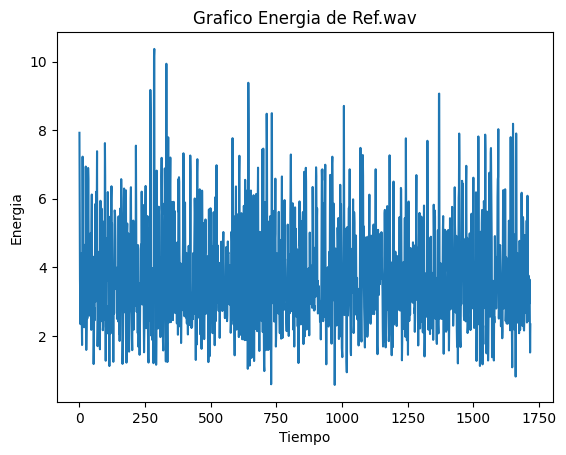

In [8]:
plt.plot(Energia(ref))
plt.xlabel('Tiempo')
plt.ylabel('Energia')
plt.title('Grafico Energia de Ref.wav')

Text(0.5, 1.0, 'Grafico Energia de frog.wav')

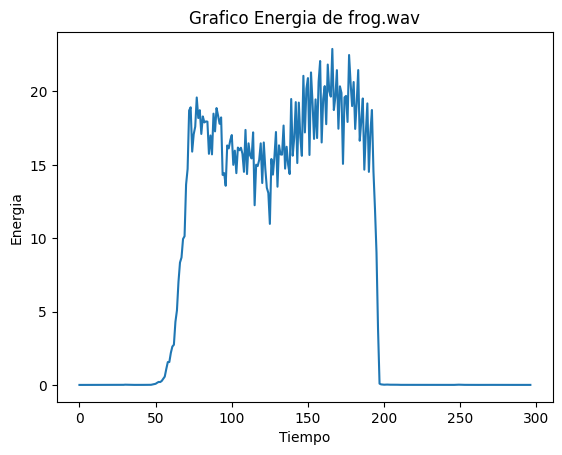

In [9]:
plt.plot(Energia(frog))
plt.xlabel('Tiempo')
plt.ylabel('Energia')
plt.title('Grafico Energia de frog.wav')

Text(0.5, 1.0, 'Grafico Energia de trueno.wav')

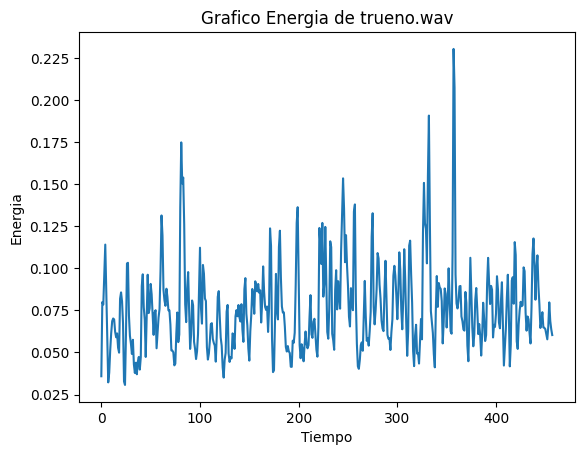

In [10]:
plt.plot(Energia(trueno))
plt.xlabel('Tiempo')
plt.ylabel('Energia')
plt.title('Grafico Energia de trueno.wav')

Posteriormente, se define la función Hamming como:
<h3 style="text-align:center">

$\Large V(n) = a_0 - a_1 cos(\frac{2\pi*n}{N-1})$
</h3>
con $a_0 = 0,53836$ y $a_1 = 0,46164$

Lo cual nos da la función:
<h3 style="text-align:center">
$ VentanaHamming(t) = Ventana(t)*V(n)$</h3>

In [11]:
w = hamming(len_f)
refHamm = (ref.T*w).T
frogHamm = (frog.T*w).T
truenoHamm = (trueno.T*w).T

Posteriormente, se compara entre una ventana arbitraria con y sin Hamming en cada señal:

Text(0.5, 1.0, 'Comparación entre Original y Hamming de ref.wav')

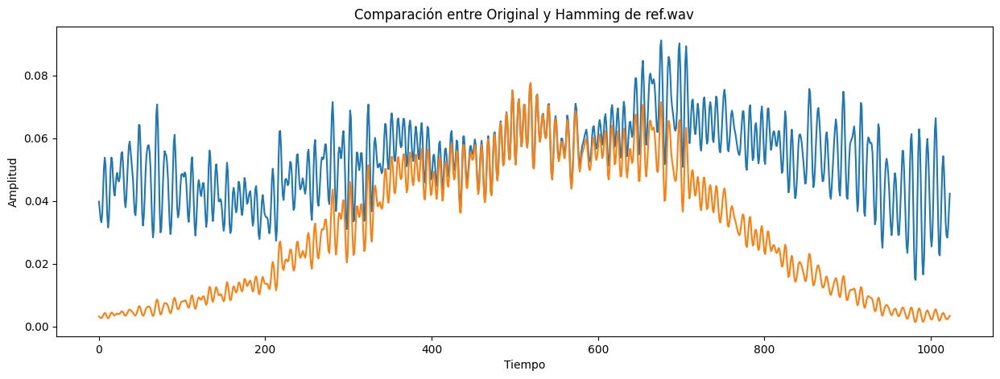

In [12]:
frames = 5
plt.figure(figsize = (15,5))
plt.plot(ref[:,frames], label = "Original")
plt.plot(refHamm[:,frames], label = "Hamming")
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.title('Comparación entre Original y Hamming de ref.wav')


Text(0.5, 1.0, 'Comparación entre Original y Hamming de frog.wav')

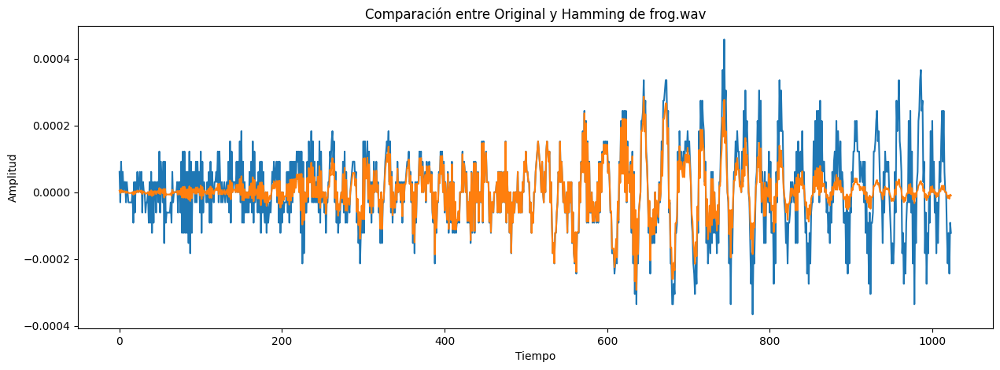

In [13]:
plt.figure(figsize = (15,5))
plt.plot(frog[:,frames], label = "Original")
plt.plot(frogHamm[:,frames], label = "Hamming")
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.title('Comparación entre Original y Hamming de frog.wav')


Text(0.5, 1.0, 'Comparación entre Original y Hamming de trueno.wav')

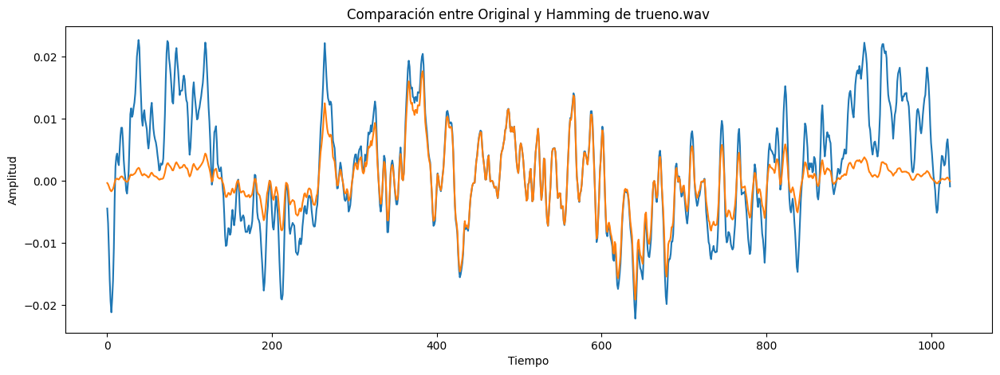

In [14]:
plt.figure(figsize = (15,5))
plt.plot(trueno[:,frames], label = "Original")
plt.plot(truenoHamm[:,frames], label = "Hamming")
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.title('Comparación entre Original y Hamming de trueno.wav')

Sabemos que la transformada de Fourier es:
<h3 style="text-align:center">$\Large X_k = \sum_{k=0}^{N-1}X_ne^{-\frac{2\pi*i}{N}kn}$</h3>

Esto se lleva a través de la siguiente función a la forma matricial que tienen actualmente las señales:

In [15]:
def FFTCalc (signalwind, len_f):
    fft_ii = []
    for i in range (signalwind.shape[1]):
        f_i = signalwind[:,i]
        ff_i = (np.abs(fftshift(fft(f_i, n = len_f))[len_f//2:]))**2
        fft_ii.append(ff_i)
    m_fft = np.asarray(fft_ii).T
    return m_fft

Se comparan las señales. Para efectos de una mejor comparación, se transforma la señal usando la siguiente forma:
<h3 style="text-align:center">$\Large
10*log_{10}(|S(f)|^2)$</h3>

Text(0.5, 1.0, 'Comparación en un frame entre Original y Hamming del FFT de ref.wav')

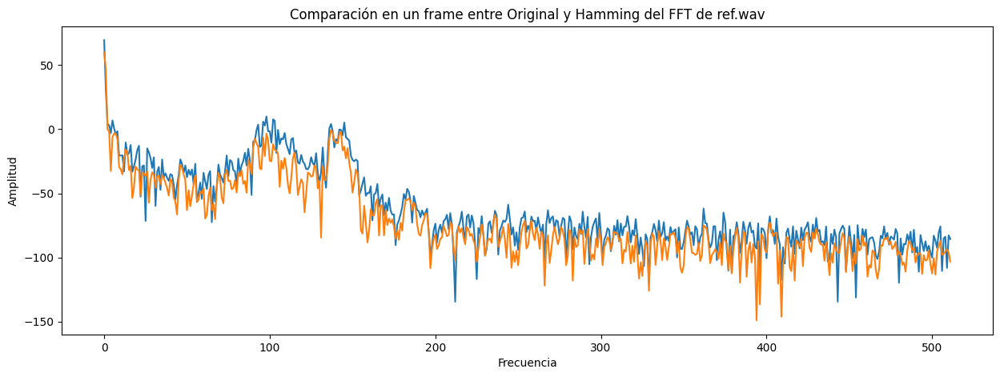

In [16]:
frames = 5
plt.figure(figsize = (15,5))
plt.plot(10*np.log10((FFTCalc(ref,len_f)[:,frames])**2), label = "Original")
plt.plot(10*np.log10((FFTCalc(refHamm,len_f)[:,frames])**2), label = "Hamming")
plt.xlabel('Frecuencia')
plt.ylabel('Amplitud')
plt.title('Comparación en un frame entre Original y Hamming del FFT de ref.wav')

Text(0.5, 1.0, 'Comparación en un frame entre Original y Hamming del FFT de frog.wav')

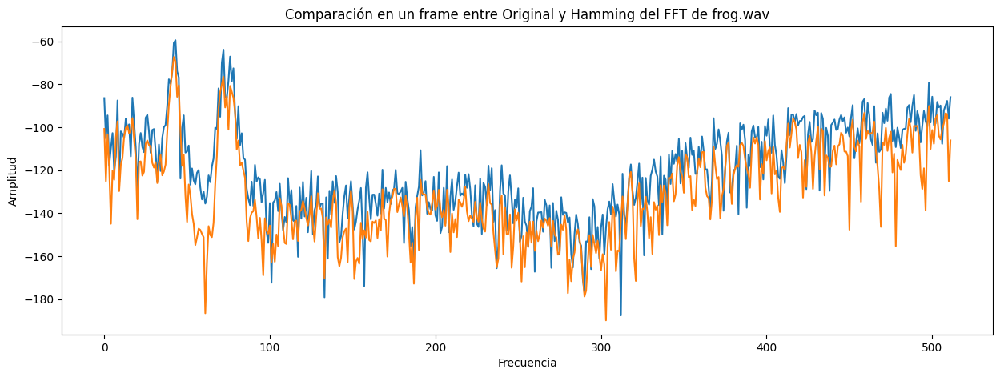

In [17]:
plt.figure(figsize = (15,5))
plt.plot(10*np.log10((FFTCalc(frog,len_f)[:,frames])**2), label = "Original")
plt.plot(10*np.log10((FFTCalc(frogHamm,len_f)[:,frames])**2), label = "Hamming")
plt.xlabel('Frecuencia')
plt.ylabel('Amplitud')
plt.title('Comparación en un frame entre Original y Hamming del FFT de frog.wav')

Text(0.5, 1.0, 'Comparación en un frame entre Original y Hamming del FFT de truenoo.wav')

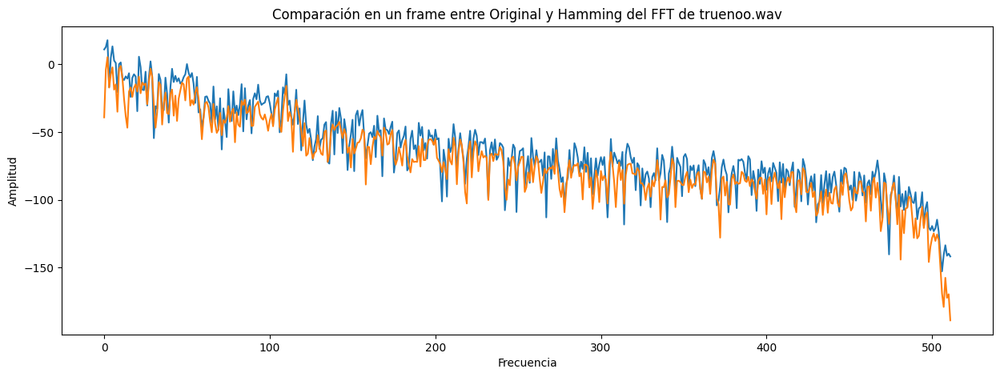

In [18]:
plt.figure(figsize = (15,5))
plt.plot(10*np.log10((FFTCalc(trueno,len_f)[:,frames])**2), label = "Original")
plt.plot(10*np.log10((FFTCalc(truenoHamm,len_f)[:,frames])**2), label = "Hamming")
plt.xlabel('Frecuencia')
plt.ylabel('Amplitud')
plt.title('Comparación en un frame entre Original y Hamming del FFT de truenoo.wav')

Podemos concluir que no son exactamente la misma forma de onda, aunque se parecen. El proceso de Hamming genera una leve degradación de la señal, la cual es apreciable en los gráficos. Para un posterior trabajo, sería interesante poder cualificar como esta degradación se traduce en terminos sonoros.